# Imbalanced learn

- https://imbalanced-learn.org/stable/

In [361]:
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
import pandas as pd
from imblearn.over_sampling import (
    RandomOverSampler,
    SMOTE,
    BorderlineSMOTE,
    SVMSMOTE,
    KMeansSMOTE,
    ADASYN,
)
import seaborn as sns
from imblearn.under_sampling import (
    ClusterCentroids,
    RandomUnderSampler,
    NearMiss,
    TomekLinks,
    EditedNearestNeighbours,
    RepeatedEditedNearestNeighbours,
    AllKNN,
    CondensedNearestNeighbour,
)
import matplotlib.colors as mcolors

from collections import Counter

## Data

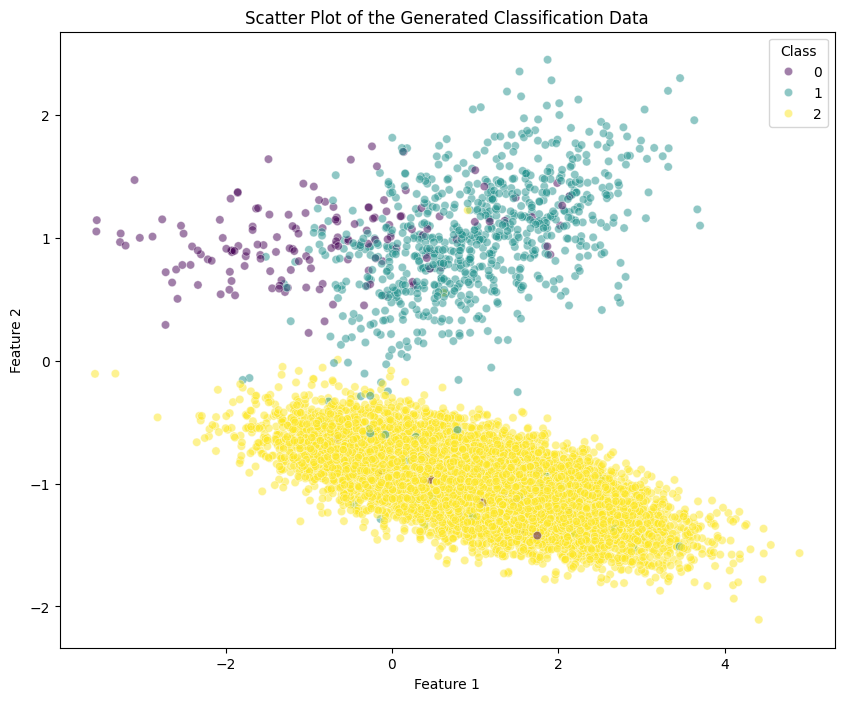

[(0, 200), (1, 797), (2, 14003)]


In [416]:
X, y = make_classification(
    n_samples=15000,
    n_features=2,
    n_informative=2,
    n_redundant=0,
    n_repeated=0,
    n_classes=3,
    n_clusters_per_class=1,
    weights=[0.01, 0.05, 0.94],
    class_sep=1.0,
    random_state=0,
)

df = pd.DataFrame(X, columns=["Feature 1", "Feature 2"])
df["Class"] = y
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x="Feature 1",
    y="Feature 2",
    hue="Class",
    palette="viridis",
    data=df,
    alpha=0.5,
)
plt.title("Scatter Plot of the Generated Classification Data")
plt.show()

print(sorted(Counter(y).items()))

In [417]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
print(X.shape, X_train.shape)

(15000, 2) (12000, 2)


## 1. Over-sampling
- https://imbalanced-learn.org/stable/over_sampling.html
- https://imbalanced-learn.org/stable/auto_examples/over-sampling/plot_comparison_over_sampling.html

| **Category**           | **Method**            | **Pros**                                                 | **Cons/When Not to Use**                                                       | **Best Use Cases**                       |
|------------------------|-----------------------|----------------------------------------------------------|--------------------------------------------------------------------------------|------------------------------------------|
| **Random Sampling**    | **Random OverSampling** | Simple, effective for quick balancing                    | Overfitting risk due to duplicated samples                                      | Quick fixes, non-complex datasets        |
| **SMOTE-Based**        | **SMOTE**             | Reduces overfitting by generating synthetic examples     | May create ambiguous samples, not ideal for overlapping classes                 | Clear decision boundaries                |
|                        | **Borderline-SMOTE**  | Focuses on decision boundary samples                     | Can produce ambiguous samples; avoid in low-noise datasets                      | Enhancing decision boundary clarity      |
|                        | **SMOTENC**           | Handles mixed data types                                 | Limited to mixed data, not for fully categorical datasets                       | Mixed categorical and numerical features |
|                        | **SMOTEN**            | Works with purely categorical data                       | Less effective with many categorical levels, avoid for numerical data           | Categorical data only                    |
|                        | **SVMSMOTE**          | Potentially more accurate with SVM-based sampling        | Computationally expensive; not ideal for resource-limited situations            | High-accuracy critical tasks             |
|                        | **KMeans SMOTE**      | Enhances sample diversity through clustering             | Complex, requires tuning; not ideal for very large datasets                     | Data with cluster structures             |
| **Adaptive Sampling**  | **ADASYN**            | Targets harder-to-classify samples                       | May generate noisy samples, avoid in noisy datasets                             | Imbalanced and complex datasets          |


### Naive random over-sampling

#### No shrinkage

In [418]:
# Apply RandomOverSampler without shrinkage
ros_no_shrink = RandomOverSampler(random_state=0)
X_resampled_no_shrink, y_resampled_no_shrink = ros_no_shrink.fit_resample(
    X_train, y_train
)
from collections import Counter

print(
    f"Random Oversampler, no shrinkage: {sorted(Counter(y_resampled_no_shrink).items())}"
)

Random Oversampler, no shrinkage: [(0, 11202), (1, 11202), (2, 11202)]


#### With Shrinkage

In [419]:
# Apply RandomOverSampler with shrinkage
ros_shrink = RandomOverSampler(random_state=0, shrinkage=0.9)
X_resampled_shrink, y_resampled_shrink = ros_shrink.fit_resample(
    X_train, y_train
)
print(
    f"Random Oversampler, shrinkage=0.9: {sorted(Counter(y_resampled_shrink).items())}"
)

Random Oversampler, shrinkage=0.9: [(0, 11202), (1, 11202), (2, 11202)]


#### Plots

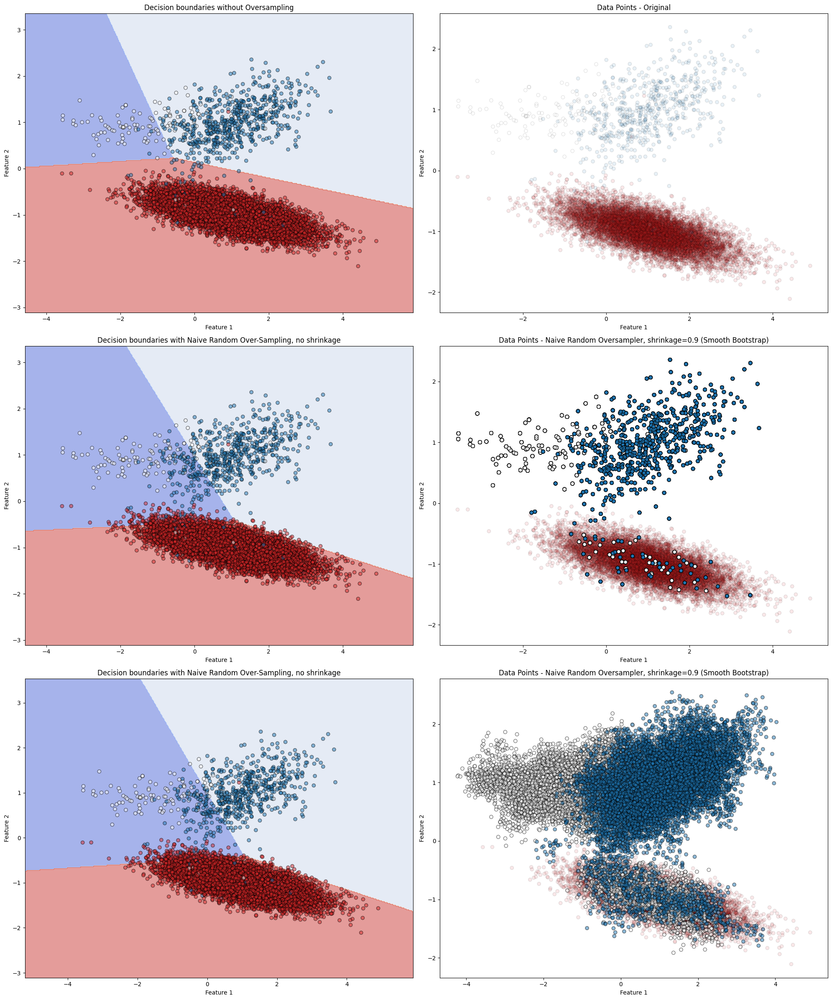

In [420]:
# Fit logistic regression model without resampling
clf_no_resampling = LogisticRegression()
clf_no_resampling.fit(X_train, y_train)

# Fit logistic regression model with resampling
clf_resampling = LogisticRegression()
clf_resampling.fit(X_resampled_no_shrink, y_resampled_no_shrink)

# Fit logistic regression model with resampled_shrink bootstrap (shrinkage)
clf_resampled_shrink = LogisticRegression()
clf_resampled_shrink.fit(X_resampled_shrink, y_resampled_shrink)


# Create mesh for plotting
h = 0.02  # step size in the mesh
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Plot decision boundary without resampling
Z_no_resampling = clf_no_resampling.predict(np.c_[xx.ravel(), yy.ravel()])
Z_no_resampling = Z_no_resampling.reshape(xx.shape)

# Create mesh for resampled data
x_min_resampled_no_shrink, x_max_resampled_no_shrink = (
    X_resampled_no_shrink[:, 0].min() - 1,
    X_resampled_no_shrink[:, 0].max() + 1,
)
y_min_resampled_no_shrink, y_max_resampled_no_shrink = (
    X_resampled_no_shrink[:, 1].min() - 1,
    X_resampled_no_shrink[:, 1].max() + 1,
)
xx_resampled_no_shrink, yy_resampled_no_shrink = np.meshgrid(
    np.arange(x_min_resampled_no_shrink, x_max_resampled_no_shrink, h),
    np.arange(y_min_resampled_no_shrink, y_max_resampled_no_shrink, h),
)

# Plot decision boundary with resampling
Z_resampled_no_shrink = clf_resampling.predict(
    np.c_[xx_resampled_no_shrink.ravel(), yy_resampled_no_shrink.ravel()]
)
Z_resampled_no_shrink = Z_resampled_no_shrink.reshape(
    xx_resampled_no_shrink.shape
)

# Create mesh for resampled data with shrinkage
x_min_resampled_shrink, x_max_resampled_shrink = (
    X_resampled_shrink[:, 0].min() - 1,
    X_resampled_shrink[:, 0].max() + 1,
)
y_min_resampled_shrink, y_max_resampled_shrink = (
    X_resampled_shrink[:, 1].min() - 1,
    X_resampled_shrink[:, 1].max() + 1,
)
xx_resampled_shrink, yy_resampled_shrink = np.meshgrid(
    np.arange(x_min_resampled_shrink, x_max_resampled_shrink, h),
    np.arange(y_min_resampled_shrink, y_max_resampled_shrink, h),
)

# Plot decision boundary for resampled data with shrinkage
Z_resampled_shrink = clf_resampled_shrink.predict(
    np.c_[xx_resampled_shrink.ravel(), yy_resampled_shrink.ravel()]
)
Z_resampled_shrink = Z_resampled_shrink.reshape(xx_resampled_shrink.shape)

# Color mapping to ensure consistency
colors = np.array(["#FFFFFF", "#1f77b4", "#d62728"])  # White, blue, red

plt.figure(figsize=(20, 24))

# ==================================================================================================

# Plot decision boundary without resampling
plt.subplot(3, 2, 1)
plt.contourf(xx, yy, Z_no_resampling, alpha=0.5, cmap="coolwarm")
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries without Oversampling")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot original data points
plt.subplot(3, 2, 2)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.title("Data Points - Original")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# ==================================================================================================

# Plot decision boundary with resampling
plt.subplot(3, 2, 3)
plt.contourf(
    xx_resampled_no_shrink,
    yy_resampled_no_shrink,
    Z_resampled_no_shrink,
    alpha=0.5,
    cmap="coolwarm",
)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with Naive Random Over-Sampling, no shrinkage")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot oversampled data points
plt.subplot(3, 2, 4)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_resampled_no_shrink[len(X_train) :, 0],
    X_resampled_no_shrink[len(X_train) :, 1],
    c=colors[y_resampled_no_shrink[len(X_train) :]],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title(
    "Data Points - Naive Random Oversampler, shrinkage=0.9 (Smooth Bootstrap)"
)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# ==================================================================================================

# Plot decision boundary with resampled_shrink bootstrap
plt.subplot(3, 2, 5)
plt.contourf(
    xx_resampled_shrink,
    yy_resampled_shrink,
    Z_resampled_shrink,
    alpha=0.5,
    cmap="coolwarm",
)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with Naive Random Over-Sampling, no shrinkage")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot smooth bootstrap data points
plt.subplot(3, 2, 6)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_resampled_shrink[len(X_train) :, 0],
    X_resampled_shrink[len(X_train) :, 1],
    c=colors[y_resampled_shrink[len(X_train) :]],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title(
    "Data Points - Naive Random Oversampler, shrinkage=0.9 (Smooth Bootstrap)"
)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# ==================================================================================================

plt.tight_layout()
plt.show()

String data are also welcomed

In [421]:
X_hetero = np.array(
    [["xxx", 1, 1.0], ["yyy", 2, 2.0], ["zzz", 3, 3.0]], dtype=object
)
y_hetero = np.array([0, 0, 1])
X_resampled, y_resampled = ros.fit_resample(X_hetero, y_hetero)
print(X_resampled)
print(y_resampled)

[['xxx' 1 1.0]
 ['yyy' 2 2.0]
 ['zzz' 3 3.0]
 ['zzz' 3 3.0]]
[0 0 1 1]


Pandas too, everyone likes pandas

In [422]:
from sklearn.datasets import fetch_openml

df_adult, y_adult = fetch_openml(
    "adult", version=2, as_frame=True, return_X_y=True
)
df_adult.head()
df_resampled, y_resampled = ros.fit_resample(df_adult, y_adult)
df_resampled.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States
4,18,NaN,103497,Some-college,10,Never-married,NaN,Own-child,White,Female,0,0,30,United-States


### SMOTE

#### SMOTE

In [423]:
# Apply SMOTE Oversampler
smote = SMOTE(random_state=0)
X_smote, y_smote = smote.fit_resample(X_train, y_train)
from collections import Counter

print(f"SMOTE Oversampler: {sorted(Counter(y_smote).items())}")

SMOTE Oversampler: [(0, 11202), (1, 11202), (2, 11202)]


#### Borderline-SMOTE

In [424]:
# Apply Borderline SMOTE Oversampler
borderlinesmote = BorderlineSMOTE(random_state=0)
X_borderlinesmote, y_borderlinesmote = borderlinesmote.fit_resample(
    X_train, y_train
)
from collections import Counter

print(
    f"Borderline SMOTE Oversampler: {sorted(Counter(y_borderlinesmote).items())}"
)

Borderline SMOTE Oversampler: [(0, 11202), (1, 11202), (2, 11202)]


#### SVMSMOTE

In [425]:
# Apply SVM SMOTE Oversampler
svmsmote = SVMSMOTE(random_state=0)
X_svmsmote, y_svmsmote = svmsmote.fit_resample(X_train, y_train)
from collections import Counter

print(f"SVM SMOTE Oversampler: {sorted(Counter(y_svmsmote).items())}")

SVM SMOTE Oversampler: [(0, 11202), (1, 11202), (2, 11202)]


#### KMeans SMOTE

In [426]:
# Apply KMeans SMOTE Oversampler
kmeanssmote = KMeansSMOTE(random_state=0, cluster_balance_threshold=0.05)
X_kmeanssmote, y_kmeanssmote = kmeanssmote.fit_resample(X_train, y_train)
from collections import Counter

print(f"KMeans SMOTE Oversampler: {sorted(Counter(y_kmeanssmote).items())}")

KMeans SMOTE Oversampler: [(0, 11202), (1, 11203), (2, 11202)]


#### Plots

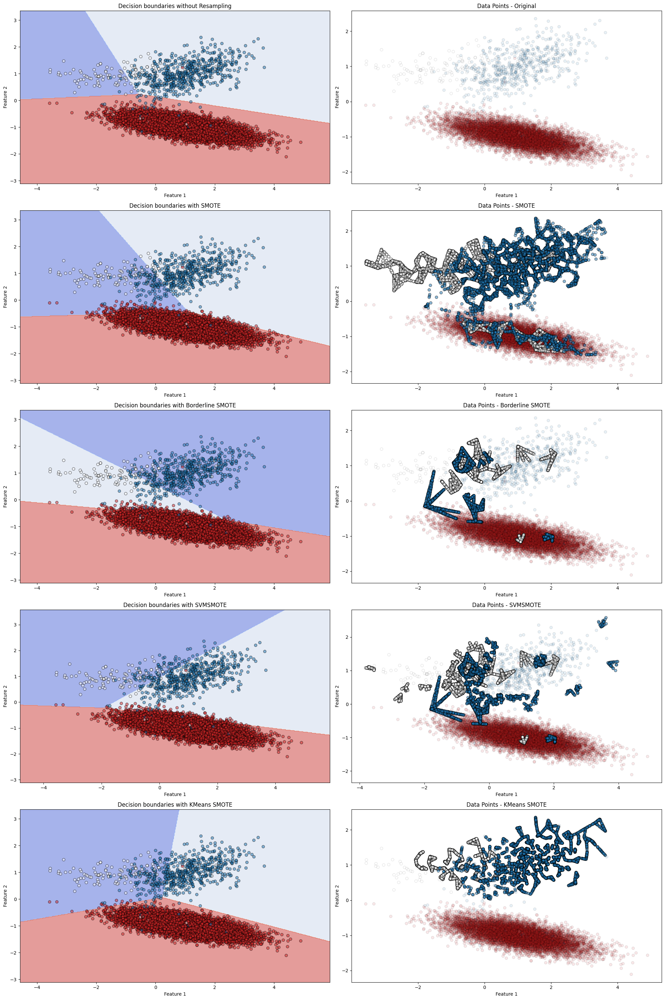

In [430]:
# Fit logistic regression models for each SMOTE variant
clf_smote = LogisticRegression()
clf_smote.fit(X_smote, y_smote)

clf_borderlinesmote = LogisticRegression()
clf_borderlinesmote.fit(X_borderlinesmote, y_borderlinesmote)

clf_svmsmote = LogisticRegression()
clf_svmsmote.fit(X_svmsmote, y_svmsmote)

clf_kmeanssmote = LogisticRegression()
clf_kmeanssmote.fit(X_kmeanssmote, y_kmeanssmote)

# Create mesh for each SMOTE variant
h = 0.02  # step size in the mesh


def create_mesh(X):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    return np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))


xx_no_resampling, yy_no_resampling = create_mesh(X_train)
xx_smote, yy_smote = create_mesh(X_smote)
xx_borderlinesmote, yy_borderlinesmote = create_mesh(X_borderlinesmote)
xx_svmsmote, yy_svmsmote = create_mesh(X_svmsmote)
xx_kmeanssmote, yy_kmeanssmote = create_mesh(X_kmeanssmote)


# Plot decision boundaries for each case
Z_no_resampling = clf_no_resampling.predict(
    np.c_[xx_no_resampling.ravel(), yy_no_resampling.ravel()]
)
Z_no_resampling = Z_no_resampling.reshape(xx_no_resampling.shape)

Z_smote = clf_smote.predict(np.c_[xx_smote.ravel(), yy_smote.ravel()])
Z_smote = Z_smote.reshape(xx_smote.shape)

Z_borderlinesmote = clf_borderlinesmote.predict(
    np.c_[xx_borderlinesmote.ravel(), yy_borderlinesmote.ravel()]
)
Z_borderlinesmote = Z_borderlinesmote.reshape(xx_borderlinesmote.shape)

Z_svmsmote = clf_svmsmote.predict(
    np.c_[xx_svmsmote.ravel(), yy_svmsmote.ravel()]
)
Z_svmsmote = Z_svmsmote.reshape(xx_svmsmote.shape)

Z_kmeanssmote = clf_kmeanssmote.predict(
    np.c_[xx_kmeanssmote.ravel(), yy_kmeanssmote.ravel()]
)
Z_kmeanssmote = Z_kmeanssmote.reshape(xx_kmeanssmote.shape)

# Plotting
plt.figure(figsize=(20, 30))

# Plot no resampling
plt.subplot(5, 2, 1)
plt.contourf(
    xx_no_resampling,
    yy_no_resampling,
    Z_no_resampling,
    alpha=0.5,
    cmap="coolwarm",
)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries without Resampling")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.subplot(5, 2, 2)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.title("Data Points - Original")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot SMOTE
plt.subplot(5, 2, 3)
plt.contourf(xx_smote, yy_smote, Z_smote, alpha=0.5, cmap="coolwarm")
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with SMOTE")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.subplot(5, 2, 4)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_smote[len(X_train) :, 0],
    X_smote[len(X_train) :, 1],
    c=colors[y_smote[len(X_train) :]],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - SMOTE")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot Borderline SMOTE
plt.subplot(5, 2, 5)
plt.contourf(
    xx_borderlinesmote,
    yy_borderlinesmote,
    Z_borderlinesmote,
    alpha=0.5,
    cmap="coolwarm",
)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with Borderline SMOTE")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.subplot(5, 2, 6)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_borderlinesmote[len(X_train) :, 0],
    X_borderlinesmote[len(X_train) :, 1],
    c=colors[y_borderlinesmote[len(X_train) :]],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - Borderline SMOTE")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot SVMSMOTE
plt.subplot(5, 2, 7)
plt.contourf(xx_svmsmote, yy_svmsmote, Z_svmsmote, alpha=0.5, cmap="coolwarm")
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with SVMSMOTE")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.subplot(5, 2, 8)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_svmsmote[len(X_train) :, 0],
    X_svmsmote[len(X_train) :, 1],
    c=colors[y_svmsmote[len(X_train) :]],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - SVMSMOTE")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot KMeans SMOTE
plt.subplot(5, 2, 9)
plt.contourf(
    xx_kmeanssmote, yy_kmeanssmote, Z_kmeanssmote, alpha=0.5, cmap="coolwarm"
)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with KMeans SMOTE")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.subplot(5, 2, 10)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_kmeanssmote[len(X_train) :, 0],
    X_kmeanssmote[len(X_train) :, 1],
    c=colors[y_kmeanssmote[len(X_train) :]],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - KMeans SMOTE")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.tight_layout()
plt.show()

### ADASYN

In [431]:
# Apply ADASYN Oversampler
adasyn = ADASYN(random_state=0)
X_adasyn, y_adasyn = adasyn.fit_resample(X_train, y_train)
from collections import Counter

print(f"ADASYN Oversampler: {sorted(Counter(y_adasyn).items())}")

ADASYN Oversampler: [(0, 11211), (1, 11136), (2, 11202)]


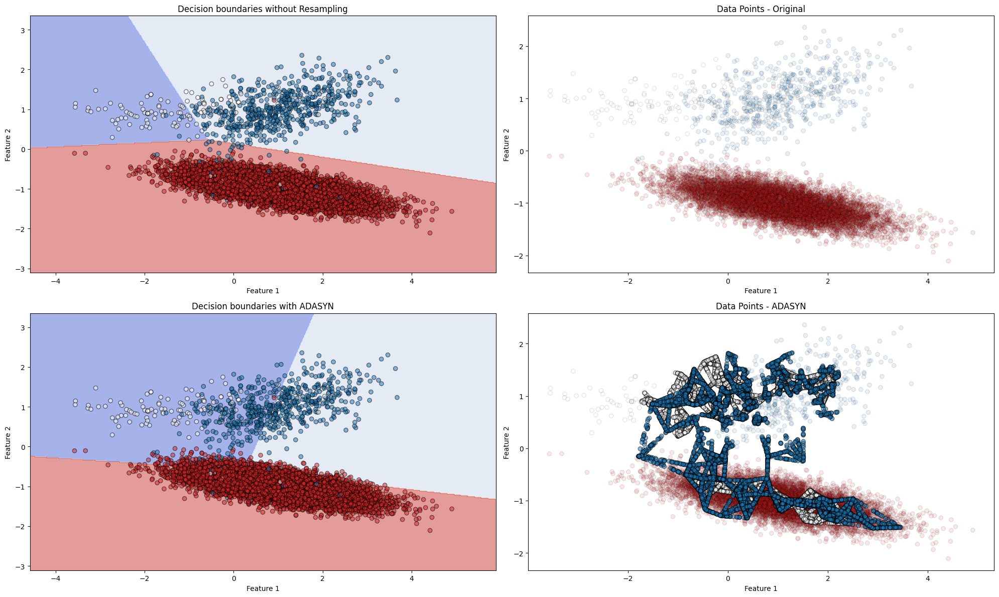

In [432]:
# Fit logistic regression models for no resampling and ADASYN
clf_no_resampling = LogisticRegression()
clf_no_resampling.fit(X_train, y_train)

clf_adasyn = LogisticRegression()
clf_adasyn.fit(X_adasyn, y_adasyn)

# Create mesh for no resampling and ADASYN
h = 0.02  # step size in the mesh


def create_mesh(X):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    return np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))


xx_no_resampling, yy_no_resampling = create_mesh(X_train)
xx_adasyn, yy_adasyn = create_mesh(X_adasyn)

# Plot decision boundaries for no resampling and ADASYN
Z_no_resampling = clf_no_resampling.predict(
    np.c_[xx_no_resampling.ravel(), yy_no_resampling.ravel()]
)
Z_no_resampling = Z_no_resampling.reshape(xx_no_resampling.shape)

Z_adasyn = clf_adasyn.predict(np.c_[xx_adasyn.ravel(), yy_adasyn.ravel()])
Z_adasyn = Z_adasyn.reshape(xx_adasyn.shape)

# Plotting
plt.figure(figsize=(20, 12))

# Plot no resampling
plt.subplot(2, 2, 1)
plt.contourf(
    xx_no_resampling,
    yy_no_resampling,
    Z_no_resampling,
    alpha=0.5,
    cmap="coolwarm",
)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries without Resampling")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.subplot(2, 2, 2)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.title("Data Points - Original")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot ADASYN
plt.subplot(2, 2, 3)
plt.contourf(xx_adasyn, yy_adasyn, Z_adasyn, alpha=0.5, cmap="coolwarm")
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with ADASYN")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.subplot(2, 2, 4)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_adasyn[len(X_train) :, 0],
    X_adasyn[len(X_train) :, 1],
    c=colors[y_adasyn[len(X_train) :]],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - ADASYN")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.tight_layout()
plt.show()

😲

### Validate

In [433]:
from sklearn.metrics import accuracy_score

# Fit logistic regression models for each resampling method
clf_no_resampling = LogisticRegression().fit(X_train, y_train)
clf_random = LogisticRegression().fit(
    X_resampled_no_shrink, y_resampled_no_shrink
)
clf_random_shrink = LogisticRegression().fit(
    X_resampled_shrink, y_resampled_shrink
)
clf_smote = LogisticRegression().fit(X_smote, y_smote)
clf_borderlinesmote = LogisticRegression().fit(
    X_borderlinesmote, y_borderlinesmote
)
clf_svmsmote = LogisticRegression().fit(X_svmsmote, y_svmsmote)
clf_kmeanssmote = LogisticRegression().fit(X_kmeanssmote, y_kmeanssmote)
clf_adasyn = LogisticRegression().fit(X_adasyn, y_adasyn)

# Make predictions
y_pred_no_resampling = clf_no_resampling.predict(X_test)
y_pred_random = clf_random.predict(X_test)
y_pred_random_shrink = clf_random_shrink.predict(X_test)
y_pred_smote = clf_smote.predict(X_test)
y_pred_borderlinesmote = clf_borderlinesmote.predict(X_test)
y_pred_svmsmote = clf_svmsmote.predict(X_test)
y_pred_kmeanssmote = clf_kmeanssmote.predict(X_test)
y_pred_adasyn = clf_adasyn.predict(X_test)

# Calculate accuracy for each model
accuracy_no_resampling = accuracy_score(y_test, y_pred_no_resampling)
accuracy_random = accuracy_score(y_test, y_pred_random)
accuracy_random_shrink = accuracy_score(y_test, y_pred_random_shrink)
accuracy_smote = accuracy_score(y_test, y_pred_smote)
accuracy_borderlinesmote = accuracy_score(y_test, y_pred_borderlinesmote)
accuracy_svmsmote = accuracy_score(y_test, y_pred_svmsmote)
accuracy_kmeanssmote = accuracy_score(y_test, y_pred_kmeanssmote)
accuracy_adasyn = accuracy_score(y_test, y_pred_adasyn)

# Print accuracy results
accuracy_results = (
    f"\n→ {'Accuracy without resampling ':-<60} {accuracy_no_resampling:.3f}"
    f"\n→ {'Accuracy with Random Oversampling ':-<60} {accuracy_random:.3f}"
    f"\n→ {'Accuracy with Random Oversampling (Shrinkage) ':-<60} {accuracy_random_shrink:.3f}"
    f"\n→ {'Accuracy with SMOTE ':-<60} {accuracy_smote:.3f}"
    f"\n→ {'Accuracy with Borderline SMOTE ':-<60} {accuracy_borderlinesmote:.3f}"
    f"\n→ {'Accuracy with SVM SMOTE ':-<60} {accuracy_svmsmote:.3f}"
    f"\n→ {'Accuracy with KMeans SMOTE ':-<60} {accuracy_kmeanssmote:.3f}"
    f"\n→ {'Accuracy with ADASYN ':-<60} {accuracy_adasyn:.3f}"
)

print(accuracy_results)


→ Accuracy without resampling -------------------------------- 0.987
→ Accuracy with Random Oversampling -------------------------- 0.963
→ Accuracy with Random Oversampling (Shrinkage) -------------- 0.962
→ Accuracy with SMOTE ---------------------------------------- 0.962
→ Accuracy with Borderline SMOTE ----------------------------- 0.920
→ Accuracy with SVM SMOTE ------------------------------------ 0.962
→ Accuracy with KMeans SMOTE --------------------------------- 0.976
→ Accuracy with ADASYN --------------------------------------- 0.910


## 2. Under-sampling

**Links**:
- https://imbalanced-learn.org/stable/under_sampling.html
- https://imbalanced-learn.org/stable/auto_examples/under-sampling/plot_comparison_under_sampling.html

**Algorithms**:
- Prototype generation methods
- Prototype selection methods
  - Controlled undersampling
  - Cleaning methods

**Comparison**
| **Category**                  | **Technique**                  | **Description**                                                                                              | **Advantages**                                      | **Disadvantages/Limitations**                          | **Best Use Cases**                                          |
|-------------------------------|--------------------------------|--------------------------------------------------------------------------------------------------------------|----------------------------------------------------|--------------------------------------------------------|------------------------------------------------------------|
| **Prototype Generation**       | **Cluster Centroids**          | Reduces sample size by representing each class with the centroids of clusters formed via K-means.            | Simplifies the dataset by reducing sample count    | Assumes data can be clustered well; may lose data variance | When dataset can be easily clustered                         |
| **Prototype Selection**        | **Random Under-Sampling**      | Randomly removes samples from the majority class to balance the dataset.                                      | Simple and fast                                    | Can discard useful data, leading to loss of information   | Quick balancing of large datasets with minor class imbalance |
|                               | **NearMiss**                   | Selects samples from the majority class based on the distance to the nearest minority class samples.          | More informed selection of samples                | Sensitive to noise and outliers                          | When class boundaries are important to preserve               |
|                               | **Tomek’s Links**              | Removes noisy samples from both classes that are closest neighbors to each other, cleaning the decision boundary. | Improves decision boundary clarity                | May remove useful borderline samples                      | Cleaning datasets with noisy or overlapping classes           |
|                               | **Edited Nearest Neighbours**  | Removes majority class samples that are misclassified by their neighbors, cleaning the dataset.               | Removes misclassified samples                     | May not be suitable for very noisy datasets               | Cleaning datasets with known misclassification issues         |
|                               | **Repeated Edited Neighbours** | Applies Edited Nearest Neighbours iteratively to further clean the dataset.                                   | More thorough cleaning of data                    | Computationally expensive                                | Deep cleaning in datasets with moderate noise                  |
|                               | **AllKNN**                     | Similar to Repeated Edited Neighbours, but increases the neighborhood size in each iteration.                 | Progressive cleaning                              | May remove too many samples                              | Datasets requiring iterative refinement of sample selection   |
|                               | **Condensed Nearest Neighbour**| Retains samples from the majority class that are hard to classify, potentially keeping noisy samples.         | Focuses on retaining difficult cases              | May keep noise; prone to overfitting                      | When it’s crucial to keep hard-to-classify instances           |
|                               | **One-Sided Selection**        | Combines Condensed Nearest Neighbour with Tomek’s Links to remove noisy samples while retaining important ones. | Balances data while reducing noise                | More complex; can still keep some noisy samples           | Datasets with significant class imbalance and noise            |
|                               | **NeighbourhoodCleaningRule**  | Cleans the dataset by removing samples identified as noise by both Edited Nearest Neighbours and 3NN classifiers. | Comprehensive cleaning                            | Computationally heavy                                     | High-noise datasets where thorough cleaning is needed          |
| **Instance Hardness**          | **Instance Hardness Threshold**| Removes hard-to-classify samples based on their probability of correct classification by a chosen estimator.  | Targets problematic samples                       | Depends on classifier performance                         | Datasets with well-defined class probabilities                 |

### Prototype Generation

#### Cluster Centroids

In [434]:
cc = ClusterCentroids(random_state=0)
X_cc, y_cc = cc.fit_resample(X_train, y_train)
print(sorted(Counter(y_cc).items()))

[(0, 163), (1, 163), (2, 163)]


#### Plots

[(0, 163), (1, 163), (2, 163)]


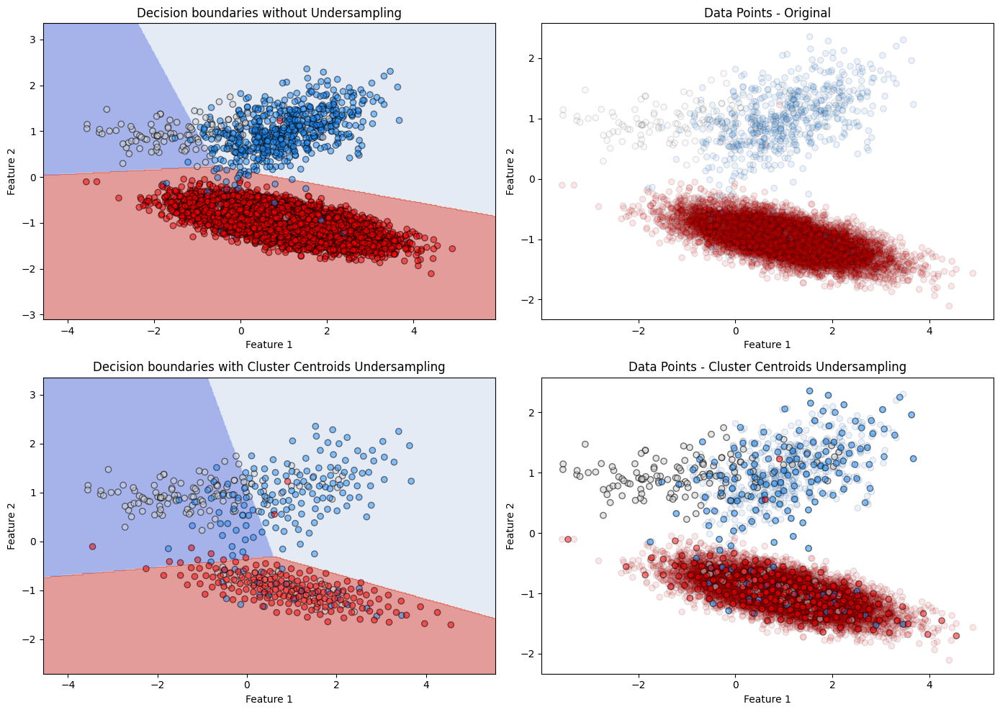

In [435]:
from imblearn.under_sampling import ClusterCentroids
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

# Assuming X_train and y_train are defined earlier in your code

# Apply Cluster Centroids Undersampling
cc = ClusterCentroids(random_state=0)
X_cc, y_cc = cc.fit_resample(X_train, y_train)
print(sorted(Counter(y_cc).items()))

# Fit logistic regression model on unchanged data
clf_unchanged = LogisticRegression()
clf_unchanged.fit(X_train, y_train)

# Fit logistic regression model on undersampled data
clf_cc = LogisticRegression()
clf_cc.fit(X_cc, y_cc)

# Create mesh for plotting
h = 0.02  # step size in the mesh


def create_mesh(X):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    return np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))


xx, yy = create_mesh(X_train)
xx_resampled, yy_resampled = create_mesh(X_cc)

# Plot decision boundary for unchanged data
Z_unchanged = clf_unchanged.predict(np.c_[xx.ravel(), yy.ravel()])
Z_unchanged = Z_unchanged.reshape(xx.shape)

# Plot decision boundary for undersampled data
Z_undersampled = clf_cc.predict(
    np.c_[xx_resampled.ravel(), yy_resampled.ravel()]
)
Z_undersampled = Z_undersampled.reshape(xx_resampled.shape)

# Color mapping to ensure consistency
colors = np.array(
    ["#D3D3D3", "#1E90FF", "#FF0000"]
)  # Gray-white, vibrant blue, more red

# Plotting
plt.figure(figsize=(14, 10))

# Plot decision boundary without undersampling
plt.subplot(2, 2, 1)
plt.contourf(xx, yy, Z_unchanged, alpha=0.5, cmap="coolwarm")
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries without Undersampling")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot original data points
plt.subplot(2, 2, 2)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.title("Data Points - Original")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot decision boundary with Cluster Centroids Undersampling
plt.subplot(2, 2, 3)
plt.contourf(
    xx_resampled, yy_resampled, Z_undersampled, alpha=0.5, cmap="coolwarm"
)
plt.scatter(
    X_cc[:, 0],
    X_cc[:, 1],
    c=colors[y_cc],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with Cluster Centroids Undersampling")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot undersampled data points, original data with alpha=0.1
plt.subplot(2, 2, 4)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_cc[:, 0],
    X_cc[:, 1],
    c=colors[y_cc],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - Cluster Centroids Undersampling")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.tight_layout()
plt.show()

### Prototype Selection

#### Controlled Under-sampling Techniques 

##### Random under-sampling

Without replacements

In [436]:
rus = RandomUnderSampler(random_state=0)
X_rus, y_rus = rus.fit_resample(X_train, y_train)
print(sorted(Counter(y_rus).items()))

[(0, 163), (1, 163), (2, 163)]


With replacements

In [437]:
rus = RandomUnderSampler(random_state=0, replacement=True)
X_rus_replacement, y_rus_replacement = rus.fit_resample(X_train, y_train)
print(sorted(Counter(y_rus_replacement).items()))

print(
    f"\n→ {'Shape of original dataset after dropping duplicates':-<100} {pd.DataFrame(X_train).drop_duplicates().shape}"
)
print(f"→ {'Shape of resampled dataset':-<100} {X_rus_replacement.shape}")
print(
    f"→ {'Shape of resampled dataset after dropping duplicates':-<100} {pd.DataFrame(X_rus_replacement).drop_duplicates().shape}"
)

[(0, 163), (1, 163), (2, 163)]

→ Shape of original dataset after dropping duplicates------------------------------------------------- (12000, 2)
→ Shape of resampled dataset-------------------------------------------------------------------------- (489, 2)
→ Shape of resampled dataset after dropping duplicates------------------------------------------------ (477, 2)


##### Near Miss 

In [438]:
nm1 = NearMiss(version=1)
X_nm1, y_nm1 = rus.fit_resample(X_train, y_train)
print(sorted(Counter(y_nm1).items()))

[(0, 163), (1, 163), (2, 163)]


In [439]:
nm2 = NearMiss(version=2)
X_nm2, y_nm2 = rus.fit_resample(X_train, y_train)
print(sorted(Counter(y_nm2).items()))

[(0, 163), (1, 163), (2, 163)]


In [440]:
nm3 = NearMiss(version=3)
X_nm3, y_nm3 = rus.fit_resample(X_train, y_train)
print(sorted(Counter(y_nm3).items()))

[(0, 163), (1, 163), (2, 163)]


##### Plots

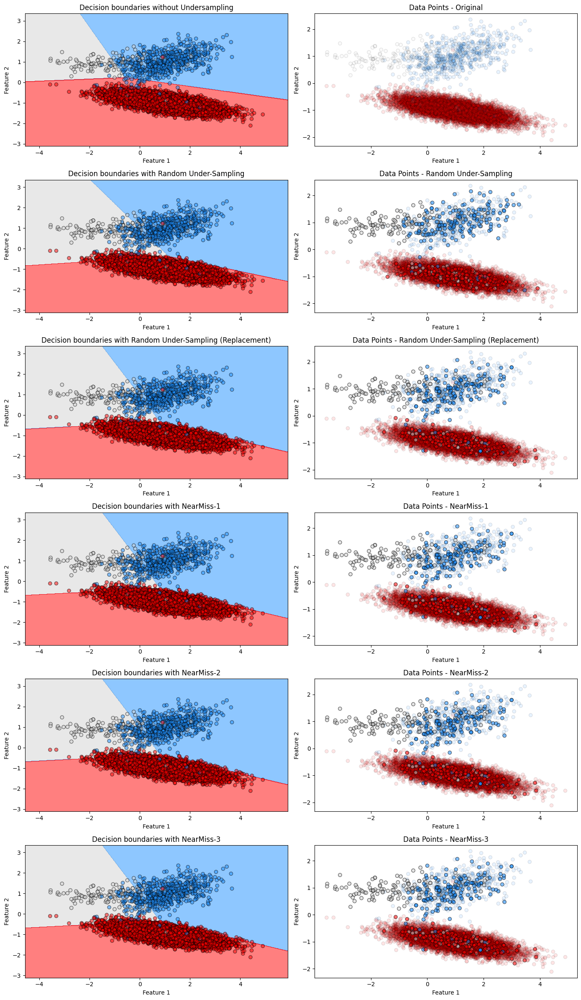

In [441]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
import matplotlib.colors as mcolors

# Define updated colors: gray-white, vibrant blue, more red
colors = np.array(
    ["#D3D3D3", "#1E90FF", "#FF0000"]
)  # Gray-white, vibrant blue, more red

# Create a custom colormap using the same colors
cmap = mcolors.ListedColormap(colors)

# Fit logistic regression model on original data (without undersampling)
clf_no_resampling = LogisticRegression()
clf_no_resampling.fit(X_train, y_train)

# Fit logistic regression models for undersampled data
clf_rus = LogisticRegression().fit(X_rus, y_rus)
clf_rus_replacement = LogisticRegression().fit(
    X_rus_replacement, y_rus_replacement
)
clf_nm1 = LogisticRegression().fit(X_nm1, y_nm1)
clf_nm2 = LogisticRegression().fit(X_nm2, y_nm2)
clf_nm3 = LogisticRegression().fit(X_nm3, y_nm3)

# Create mesh for plotting
h = 0.02  # step size in the mesh


def create_mesh(X):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    return np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))


xx, yy = create_mesh(X_train)

# Plot decision boundaries
Z_no_resampling = clf_no_resampling.predict(np.c_[xx.ravel(), yy.ravel()])
Z_no_resampling = Z_no_resampling.reshape(xx.shape)

Z_rus = clf_rus.predict(np.c_[xx.ravel(), yy.ravel()])
Z_rus = Z_rus.reshape(xx.shape)

Z_rus_replacement = clf_rus_replacement.predict(np.c_[xx.ravel(), yy.ravel()])
Z_rus_replacement = Z_rus_replacement.reshape(xx.shape)

Z_nm1 = clf_nm1.predict(np.c_[xx.ravel(), yy.ravel()])
Z_nm1 = Z_nm1.reshape(xx.shape)

Z_nm2 = clf_nm2.predict(np.c_[xx.ravel(), yy.ravel()])
Z_nm2 = Z_nm2.reshape(xx.shape)

Z_nm3 = clf_nm3.predict(np.c_[xx.ravel(), yy.ravel()])
Z_nm3 = Z_nm3.reshape(xx.shape)

# Plotting
plt.figure(figsize=(14, 24))

# Plot decision boundary without undersampling
plt.subplot(6, 2, 1)
plt.contourf(xx, yy, Z_no_resampling, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries without Undersampling")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot original data points
plt.subplot(6, 2, 2)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.title("Data Points - Original")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot decision boundary for Random Under-Sampling (using original data for the plot)
plt.subplot(6, 2, 3)
plt.contourf(xx, yy, Z_rus, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with Random Under-Sampling")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot data points for Random Under-Sampling
plt.subplot(6, 2, 4)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_rus[:, 0],
    X_rus[:, 1],
    c=colors[y_rus],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - Random Under-Sampling")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot decision boundary for Random Under-Sampling with replacement (using original data for the plot)
plt.subplot(6, 2, 5)
plt.contourf(xx, yy, Z_rus_replacement, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with Random Under-Sampling (Replacement)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot data points for Random Under-Sampling with replacement
plt.subplot(6, 2, 6)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_rus_replacement[:, 0],
    X_rus_replacement[:, 1],
    c=colors[y_rus_replacement],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - Random Under-Sampling (Replacement)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot decision boundary for NearMiss-1 (using original data for the plot)
plt.subplot(6, 2, 7)
plt.contourf(xx, yy, Z_nm1, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with NearMiss-1")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot data points for NearMiss-1
plt.subplot(6, 2, 8)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_nm1[:, 0],
    X_nm1[:, 1],
    c=colors[y_nm1],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - NearMiss-1")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot decision boundary for NearMiss-2 (using original data for the plot)
plt.subplot(6, 2, 9)
plt.contourf(xx, yy, Z_nm2, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with NearMiss-2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot data points for NearMiss-2
plt.subplot(6, 2, 10)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_nm2[:, 0],
    X_nm2[:, 1],
    c=colors[y_nm2],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - NearMiss-2")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot decision boundary for NearMiss-3 (using original data for the plot)
plt.subplot(6, 2, 11)
plt.contourf(xx, yy, Z_nm3, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with NearMiss-3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot data points for NearMiss-3
plt.subplot(6, 2, 12)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_nm3[:, 0],
    X_nm3[:, 1],
    c=colors[y_nm3],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - NearMiss-3")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.tight_layout()
plt.show()

 #### Cleaning Under-sampling Techniques

##### Tomek's Links

In [442]:
tl = TomekLinks()
X_tl, y_tl = tl.fit_resample(X_train, y_train)
print(sorted(Counter(y_tl).items()))

[(0, 163), (1, 584), (2, 11150)]


##### Edited Nearest Neighbours (ENN)

In [443]:
enn = EditedNearestNeighbours()
X_enn, y_enn = enn.fit_resample(X_train, y_train)
print(sorted(Counter(y_enn).items()))

[(0, 163), (1, 462), (2, 10930)]


##### Repeated Edited Nearest Neighbours (RENN) 

In [444]:
renn = RepeatedEditedNearestNeighbours()
X_renn, y_renn = renn.fit_resample(X_train, y_train)
print(sorted(Counter(y_renn).items()))

[(0, 163), (1, 413), (2, 10875)]


##### AllKNN

In [445]:
allknn = AllKNN()
X_allknn, y_allknn = allknn.fit_resample(X_train, y_train)
print(sorted(Counter(y_allknn).items()))

[(0, 163), (1, 438), (2, 11008)]


##### Condensed Nearest Neighbour (CNN)

In [446]:
cnn = CondensedNearestNeighbour()
X_cnn, y_cnn = cnn.fit_resample(X_train, y_train)
print(sorted(Counter(y_cnn).items()))

##### Plots

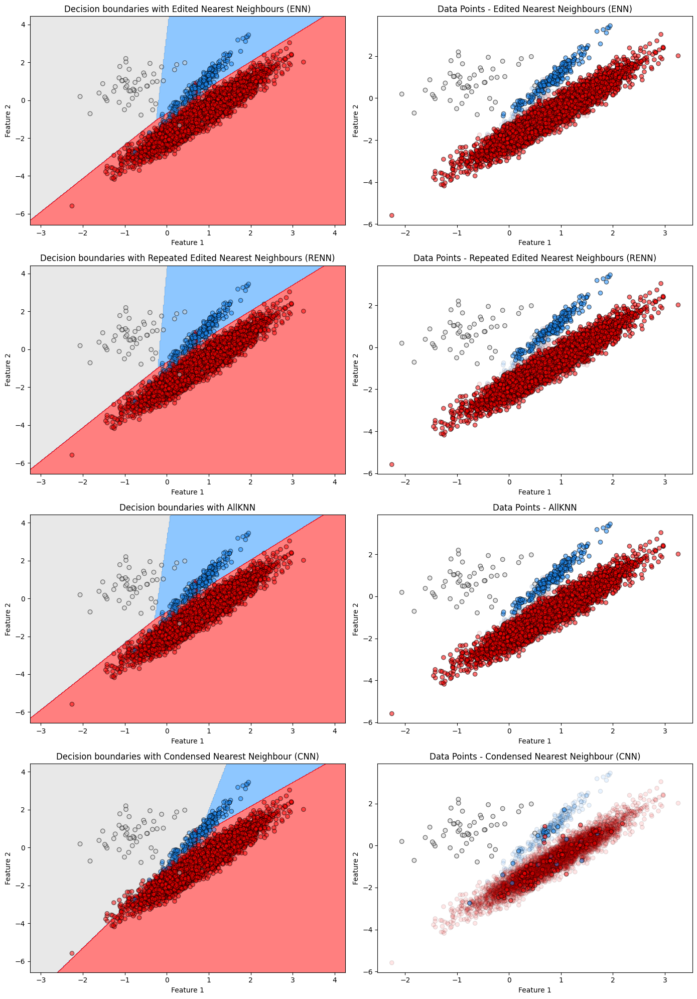

In [ ]:
# Fit logistic regression models for undersampled data
clf_enn = LogisticRegression().fit(X_enn, y_enn)
clf_renn = LogisticRegression().fit(X_renn, y_renn)
clf_allknn = LogisticRegression().fit(X_allknn, y_allknn)
clf_cnn = LogisticRegression().fit(X_cnn, y_cnn)

# Create mesh for plotting
h = 0.02  # step size in the mesh


def create_mesh(X):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    return np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))


xx, yy = create_mesh(X_train)

# Plot decision boundaries
Z_enn = clf_enn.predict(np.c_[xx.ravel(), yy.ravel()])
Z_enn = Z_enn.reshape(xx.shape)

Z_renn = clf_renn.predict(np.c_[xx.ravel(), yy.ravel()])
Z_renn = Z_renn.reshape(xx.shape)

Z_allknn = clf_allknn.predict(np.c_[xx.ravel(), yy.ravel()])
Z_allknn = Z_allknn.reshape(xx.shape)

Z_cnn = clf_cnn.predict(np.c_[xx.ravel(), yy.ravel()])
Z_cnn = Z_cnn.reshape(xx.shape)

# Plotting
plt.figure(figsize=(14, 20))

# Plot decision boundary with Edited Nearest Neighbours
plt.subplot(4, 2, 1)
plt.contourf(xx, yy, Z_enn, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with Edited Nearest Neighbours (ENN)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot data points for Edited Nearest Neighbours
plt.subplot(4, 2, 2)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_enn[:, 0],
    X_enn[:, 1],
    c=colors[y_enn],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - Edited Nearest Neighbours (ENN)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot decision boundary with Repeated Edited Nearest Neighbours
plt.subplot(4, 2, 3)
plt.contourf(xx, yy, Z_renn, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with Repeated Edited Nearest Neighbours (RENN)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot data points for Repeated Edited Nearest Neighbours
plt.subplot(4, 2, 4)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_renn[:, 0],
    X_renn[:, 1],
    c=colors[y_renn],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - Repeated Edited Nearest Neighbours (RENN)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot decision boundary with AllKNN
plt.subplot(4, 2, 5)
plt.contourf(xx, yy, Z_allknn, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with AllKNN")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot data points for AllKNN
plt.subplot(4, 2, 6)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_allknn[:, 0],
    X_allknn[:, 1],
    c=colors[y_allknn],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - AllKNN")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot decision boundary with Condensed Nearest Neighbour
plt.subplot(4, 2, 7)
plt.contourf(xx, yy, Z_cnn, alpha=0.5, cmap=cmap)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Decision boundaries with Condensed Nearest Neighbour (CNN)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

# Plot data points for Condensed Nearest Neighbour
plt.subplot(4, 2, 8)
plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=colors[y_train],
    edgecolor="k",
    marker="o",
    alpha=0.1,
)
plt.scatter(
    X_cnn[:, 0],
    X_cnn[:, 1],
    c=colors[y_cnn],
    edgecolor="k",
    marker="o",
    alpha=0.5,
)
plt.title("Data Points - Condensed Nearest Neighbour (CNN)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

plt.tight_layout()
plt.show()

### Validate

In [ ]:
# Make predictions
y_pred_no_resampling = clf_no_resampling.predict(X_test)
y_pred_rus = clf_rus.predict(X_test)
y_pred_rus_replacement = clf_rus_replacement.predict(X_test)
y_pred_nm1 = clf_nm1.predict(X_test)
y_pred_nm2 = clf_nm2.predict(X_test)
y_pred_nm3 = clf_nm3.predict(X_test)
y_pred_cc = clf_cc.predict(X_test)
y_pred_enn = clf_enn.predict(X_test)
y_pred_renn = clf_renn.predict(X_test)
y_pred_allknn = clf_allknn.predict(X_test)
y_pred_cnn = clf_cnn.predict(X_test)

# Calculate accuracy for each model
accuracy_no_resampling = accuracy_score(y_test, y_pred_no_resampling)
accuracy_rus = accuracy_score(y_test, y_pred_rus)
accuracy_rus_replacement = accuracy_score(y_test, y_pred_rus_replacement)
accuracy_nm1 = accuracy_score(y_test, y_pred_nm1)
accuracy_nm2 = accuracy_score(y_test, y_pred_nm2)
accuracy_nm3 = accuracy_score(y_test, y_pred_nm3)
accuracy_cc = accuracy_score(y_test, y_pred_cc)
accuracy_enn = accuracy_score(y_test, y_pred_enn)
accuracy_renn = accuracy_score(y_test, y_pred_renn)
accuracy_allknn = accuracy_score(y_test, y_pred_allknn)
accuracy_cnn = accuracy_score(y_test, y_pred_cnn)

# Print accuracy results
accuracy_results = (
    f"\n→ {'Accuracy without resampling ':-<60} {accuracy_no_resampling:.3f}"
    f"\n→ {'Accuracy with Random Under-Sampling ':-<60} {accuracy_rus:.3f}"
    f"\n→ {'Accuracy with Random Under-Sampling (Replacement) ':-<60} {accuracy_rus_replacement:.3f}"
    f"\n→ {'Accuracy with NearMiss-1 ':-<60} {accuracy_nm1:.3f}"
    f"\n→ {'Accuracy with NearMiss-2 ':-<60} {accuracy_nm2:.3f}"
    f"\n→ {'Accuracy with NearMiss-3 ':-<60} {accuracy_nm3:.3f}"
    f"\n→ {'Accuracy with Cluster Centroids ':-<60} {accuracy_cc:.3f}"
    f"\n→ {'Accuracy with Edited Nearest Neighbours (ENN) ':-<60} {accuracy_enn:.3f}"
    f"\n→ {'Accuracy with Repeated Edited Nearest Neighbours (RENN) ':-<60} {accuracy_renn:.3f}"
    f"\n→ {'Accuracy with AllKNN ':-<60} {accuracy_allknn:.3f}"
    f"\n→ {'Accuracy with Condensed Nearest Neighbour (CNN) ':-<60} {accuracy_cnn:.3f}"
)

print(accuracy_results)


→ Accuracy without resampling -------------------------------- 0.992
→ Accuracy with Random Under-Sampling ------------------------ 0.917
→ Accuracy with Random Under-Sampling (Replacement) ---------- 0.889
→ Accuracy with NearMiss-1 ----------------------------------- 0.889
→ Accuracy with NearMiss-2 ----------------------------------- 0.889
→ Accuracy with NearMiss-3 ----------------------------------- 0.889
→ Accuracy with Cluster Centroids ---------------------------- 0.933
→ Accuracy with Edited Nearest Neighbours (ENN) -------------- 0.989
→ Accuracy with Repeated Edited Nearest Neighbours (RENN) ---- 0.989
→ Accuracy with AllKNN --------------------------------------- 0.990
→ Accuracy with Condensed Nearest Neighbour (CNN) ------------ 0.958
